<a href="https://colab.research.google.com/github/Jaeeyun/Titanic_Kaggle/blob/main/titanic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Titanic_kaggle_prac

## 1. 라이브러리 임포트


In [1]:
# 기본 데이터 정리 및 처리
import numpy as np
import pandas as pd

# 시각화
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import missingno

# 전처리 및 머신 러닝 알고리즘
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier

# 모델 튜닝 및 평가
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn import model_selection

# 경고 제거 (판다스가 에러 메세지를 자주 만들어 내기 때문에 이를 일단 무시하도록 설정합니다.)
import sys
import warnings

import warnings
warnings.filterwarnings('ignore')

<ipython-input-1-8c27cffba6e7>:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## 2. 데이터 준비

In [2]:
!pip install kaggle

In [3]:
%%shell
# 현재 디렉토리 저장
original_dir=$(pwd)

# "kaggle.json" 파일 복사 및 권한 변경 명령 실행
ls -1ha /content/drive/MyDrive/Colab\ Notebooks/kaggle.json
mkdir -p ~/.kaggle
cp /content/drive/MyDrive/Colab\ Notebooks/kaggle.json ~/.kaggle/
chmod 600 ~/.kaggle/kaggle.json

# 이전 디렉토리로 복귀
cd $original_dir

'/content/drive/MyDrive/Colab Notebooks/kaggle.json'


In [4]:
!kaggle competitions download -c titanic

  0% 0.00/34.1k [00:00<?, ?B/s]
100% 34.1k/34.1k [00:00<00:00, 35.2MB/s]


In [5]:
!ls

drive  sample_data  titanic.zip


In [6]:
!unzip /content/titanic.zip

Archive:  /content/titanic.zip
  inflating: gender_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [7]:
test = pd.read_csv('/content/test.csv')
train = pd.read_csv('/content/train.csv')

In [8]:
# 데이터 확인
train.head(n=3)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


## 3. 데이터 병합

In [9]:
# 병합 준비
ntrain = train.shape[0]
ntest = test.shape[0]

# train 답 저장
y_train = train['Survived'].values

# 제출용 column 저장
passId = test['PassengerId']

# 병합 데이터 만들기
data = pd.concat((train, test))

# 데이터 shape 확인
print("data shape is: {}".format(data.shape))

data shape is: (1309, 12)


In [10]:
pd.set_option('display.max_rows', None)

## 4. 전체 Data Analysis (x)

### 전체 데이터 살피기

In [ ]:
sorted_train = train.sort_values(by='Ticket')
pd.options.display.max_rows = 60

In [ ]:
sorted_train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
504,505,1,1,"Maioni, Miss. Roberta",female,16.0,0,0,110152,86.500,B79,S
257,258,1,1,"Cherry, Miss. Gladys",female,30.0,0,0,110152,86.500,B77,S
759,760,1,1,"Rothes, the Countess. of (Lucy Noel Martha Dye...",female,33.0,0,0,110152,86.500,B77,S
262,263,0,1,"Taussig, Mr. Emil",male,52.0,1,1,110413,79.650,E67,S
558,559,1,1,"Taussig, Mrs. Emil (Tillie Mandelbaum)",female,39.0,1,1,110413,79.650,E67,S
...,...,...,...,...,...,...,...,...,...,...,...,...
235,236,0,3,"Harknett, Miss. Alice Phoebe",female,NaN,0,0,W./C. 6609,7.550,NaN,S
92,93,0,1,"Chaffee, Mr. Herbert Fuller",male,46.0,1,0,W.E.P. 5734,61.175,E31,S
219,220,0,2,"Harris, Mr. Walter",male,30.0,0,0,W/C 14208,10.500,NaN,S
540,541,1,1,"Crosby, Miss. Harriet R",female,36.0,0,2,WE/P 5735,71.000,B22,S


### 빈 값 확인

<Axes: >

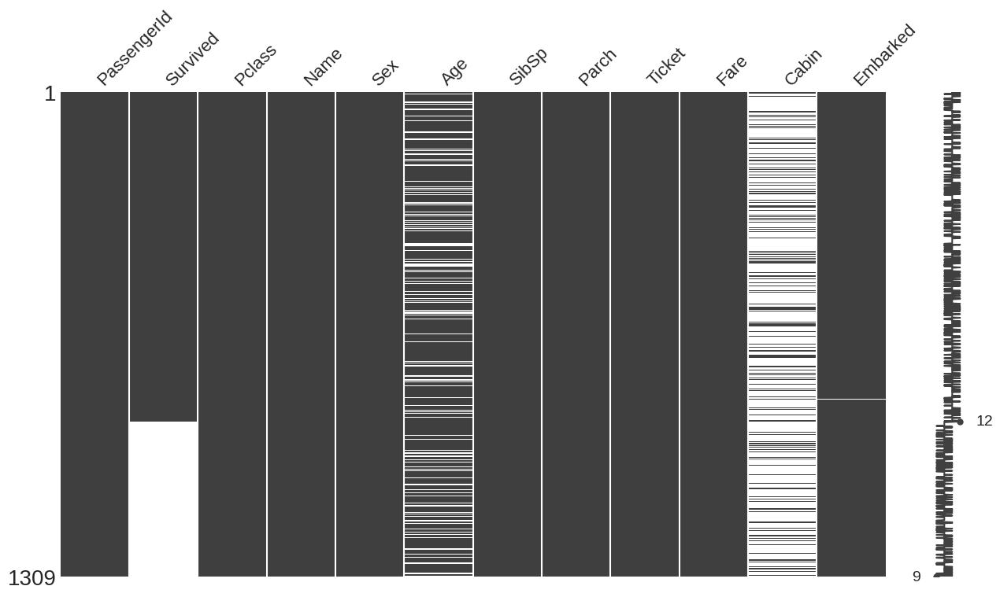

In [ ]:
# 빈 값 확인
missingno.matrix(data, figsize = (15,8))

In [ ]:
data.isnull().sum() #비어 있는 값들을 체크

PassengerId       0
Survived        418
Pclass            0
Name              0
Sex               0
Age             263
SibSp             0
Parch             0
Ticket            0
Fare              1
Cabin          1014
Embarked          2
SP_group          0
dtype: int64

Age, Cabin에 많은 값이 비어져 있고 Fare, Embarked에 조금 비어있는 것을 확인 가능함

- Age는 아마 name, sibsp, parch에 영향을 받을 것이다.

In [ ]:
train.sort_values(by="Name")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
845,846,0,3,"Abbing, Mr. Anthony",male,42.0,0,0,C.A. 5547,7.5500,NaN,S
746,747,0,3,"Abbott, Mr. Rossmore Edward",male,16.0,1,1,C.A. 2673,20.2500,NaN,S
279,280,1,3,"Abbott, Mrs. Stanton (Rosa Hunt)",female,35.0,1,1,C.A. 2673,20.2500,NaN,S
308,309,0,2,"Abelson, Mr. Samuel",male,30.0,1,0,P/PP 3381,24.0000,NaN,C
874,875,1,2,"Abelson, Mrs. Samuel (Hannah Wizosky)",female,28.0,1,0,P/PP 3381,24.0000,NaN,C
...,...,...,...,...,...,...,...,...,...,...,...,...
286,287,1,3,"de Mulder, Mr. Theodore",male,30.0,0,0,345774,9.5000,NaN,S
282,283,0,3,"de Pelsmaeker, Mr. Alfons",male,16.0,0,0,345778,9.5000,NaN,S
361,362,0,2,"del Carlo, Mr. Sebastiano",male,29.0,1,0,SC/PARIS 2167,27.7208,NaN,C
153,154,0,3,"van Billiard, Mr. Austin Blyler",male,40.5,0,2,A/5. 851,14.5000,NaN,S


In [ ]:
train[(train['Age'] < 10)].sort_values(by="Fare")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
803,804,1,3,"Thomas, Master. Assad Alexander",male,0.42,0,1,2625,8.5167,NaN,C
205,206,0,3,"Strom, Miss. Telma Matilda",female,2.00,0,1,347054,10.4625,G6,S
869,870,1,3,"Johnson, Master. Harold Theodor",male,4.00,1,1,347742,11.1333,NaN,S
172,173,1,3,"Johnson, Miss. Eleanor Ileen",female,1.00,1,1,347742,11.1333,NaN,S
479,480,1,3,"Hirvonen, Miss. Hildur E",female,2.00,0,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
480,481,0,3,"Goodwin, Master. Harold Victor",male,9.00,5,2,CA 2144,46.9000,NaN,S
386,387,0,3,"Goodwin, Master. Sidney Leonard",male,1.00,5,2,CA 2144,46.9000,NaN,S
445,446,1,1,"Dodge, Master. Washington",male,4.00,0,2,33638,81.8583,A34,S
305,306,1,1,"Allison, Master. Hudson Trevor",male,0.92,1,2,113781,151.5500,C22 C26,S


### 변수 간 상관관계 확인

In [ ]:
# Co-relation 매트릭스
corr = data.corr()
corr

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
PassengerId,1.000000,-0.005007,-0.038354,0.028814,-0.055224,0.008942,0.031428
Survived,-0.005007,1.000000,-0.338481,-0.077221,-0.035322,0.081629,0.257307
Pclass,-0.038354,-0.338481,1.000000,-0.408106,0.060832,0.018322,-0.558629
Age,0.028814,-0.077221,-0.408106,1.000000,-0.243699,-0.150917,0.178740
SibSp,-0.055224,-0.035322,0.060832,-0.243699,1.000000,0.373587,0.160238
Parch,0.008942,0.081629,0.018322,-0.150917,0.373587,1.000000,0.221539
Fare,0.031428,0.257307,-0.558629,0.178740,0.160238,0.221539,1.000000


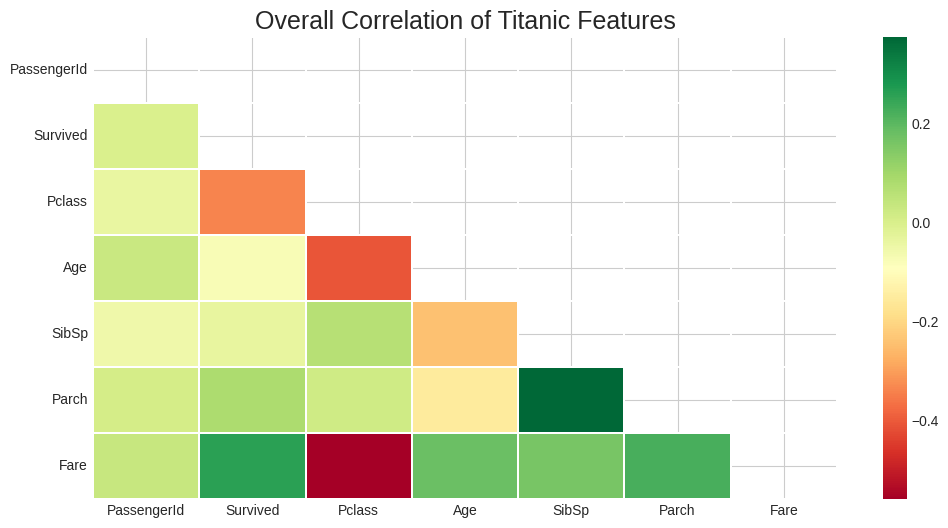

In [ ]:
# 마스크 셋업
mask = np.zeros_like(corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True
# 그래프 셋업
plt.figure(figsize=(12,6))
# 그래프 타이틀
plt.title('Overall Correlation of Titanic Features', fontsize=18)
#  Co-relation 히트맵
sns.heatmap(corr, mask=mask, annot=False,cmap='RdYlGn', linewidths=0.2, annot_kws={'size':20})
plt.show()

**상관관계 분석**
1. passengerId: 다른 열과는 크게 상관 없음
2. survived: **pclass**는 낮을 수록 **fare**는 클 수록 생존 확률 높음
3. pclass: **fare**가 낮을 수록 pclass 숫자가 큼
4. Age: 다른 열과는 크게 상관 없음
5. sibsip: ***parch***가 많을 수록 sibsip도 많을 수도 있음
6. parch: 다른 열과는 크게 상관 없음

- 숫자가 아닌 문자열 데이터인 **sex, ticket, cabin, embarked**는 조사 안함

### 항목 분석

In [ ]:
train['PassengerId'].value_counts().sort_index()

1      1
2      1
3      1
4      1
5      1
      ..
887    1
888    1
889    1
890    1
891    1
Name: PassengerId, Length: 891, dtype: int64

In [ ]:
train['Pclass'].value_counts().sort_index()

1    216
2    184
3    491
Name: Pclass, dtype: int64

In [ ]:
train['Pclass'].value_counts().sort_index()

In [ ]:
train['Name'].value_counts().sort_index()

Abbing, Mr. Anthony                      1
Abbott, Mr. Rossmore Edward              1
Abbott, Mrs. Stanton (Rosa Hunt)         1
Abelson, Mr. Samuel                      1
Abelson, Mrs. Samuel (Hannah Wizosky)    1
                                        ..
de Mulder, Mr. Theodore                  1
de Pelsmaeker, Mr. Alfons                1
del Carlo, Mr. Sebastiano                1
van Billiard, Mr. Austin Blyler          1
van Melkebeke, Mr. Philemon              1
Name: Name, Length: 891, dtype: int64

In [ ]:
train['Age'].value_counts().sort_index()

0.42     1
0.67     1
0.75     2
0.83     2
0.92     1
        ..
70.00    2
70.50    1
71.00    2
74.00    1
80.00    1
Name: Age, Length: 88, dtype: int64

In [ ]:
train['SibSp'].value_counts().sort_index()

0    608
1    209
2     28
3     16
4     18
5      5
8      7
Name: SibSp, dtype: int64

In [ ]:
train['Parch'].value_counts().sort_index()

0    678
1    118
2     80
3      5
4      4
5      5
6      1
Name: Parch, dtype: int64

In [ ]:
train['Ticket'].value_counts().sort_index()

110152         3
110413         3
110465         2
110564         1
110813         1
              ..
W./C. 6608     4
W./C. 6609     1
W.E.P. 5734    1
W/C 14208      1
WE/P 5735      2
Name: Ticket, Length: 681, dtype: int64

In [ ]:
train['Fare'].value_counts().sort_index()

0.0000      15
4.0125       1
5.0000       1
6.2375       1
6.4375       1
            ..
227.5250     4
247.5208     2
262.3750     2
263.0000     4
512.3292     3
Name: Fare, Length: 248, dtype: int64

In [ ]:
train['Cabin'].value_counts().sort_index()

A10    1
A14    1
A16    1
A19    1
A20    1
      ..
F33    3
F38    1
F4     2
G6     4
T      1
Name: Cabin, Length: 147, dtype: int64

In [ ]:
train['Embarked'].value_counts().sort_index()

C    168
Q     77
S    644
Name: Embarked, dtype: int64

## 결측값 채우기

In [11]:
# 임시 저장값 만들기
temp = data.copy()
temp

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S
5,6,0.0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C


### Age 결측값 채우기

#### 아이인 경우 예측하기

##### Master인 경우 채우기

In [12]:
# 결측값 확인용
data.loc[(data['Name'].str.split(',').str[1].str.split('.').str[0].str.strip() == 'Master') & (data['Age'].isnull())]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
65,66,1.0,3,"Moubarek, Master. Gerios",male,NaN,1,1,2661,15.2458,NaN,C
159,160,0.0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.5500,NaN,S
176,177,0.0,3,"Lefebre, Master. Henry Forbes",male,NaN,3,1,4133,25.4667,NaN,S
709,710,1.0,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
244,1136,NaN,3,"Johnston, Master. William Arthur Willie""""",male,NaN,1,2,W./C. 6607,23.4500,NaN,S
339,1231,NaN,3,"Betros, Master. Seman",male,NaN,0,0,2622,7.2292,NaN,C
344,1236,NaN,3,"van Billiard, Master. James William",male,NaN,1,1,A/5. 851,14.5000,NaN,S
417,1309,NaN,3,"Peter, Master. Michael J",male,NaN,1,1,2668,22.3583,NaN,C


In [13]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Moubarek']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
65,66,1.0,3,"Moubarek, Master. Gerios",male,NaN,1,1,2661,15.2458,NaN,C
709,710,1.0,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
225,1117,NaN,3,"Moubarek, Mrs. George (Omine Amenia"" Alexander)""",female,NaN,0,2,2661,15.2458,NaN,C


In [14]:
temp.loc[(temp['PassengerId']==66), 'Age'] = 5
temp.loc[(temp['PassengerId']==710), 'Age'] = 5
temp.loc[(temp['PassengerId']==1117), 'Age'] = 30

temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Moubarek']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
65,66,1.0,3,"Moubarek, Master. Gerios",male,5.0,1,1,2661,15.2458,NaN,C
709,710,1.0,3,"Moubarek, Master. Halim Gonios (""William George"")",male,5.0,1,1,2661,15.2458,NaN,C
225,1117,NaN,3,"Moubarek, Mrs. George (Omine Amenia"" Alexander)""",female,30.0,0,2,2661,15.2458,NaN,C


In [15]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Sage']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0.0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.55,NaN,S
180,181,0.0,3,"Sage, Miss. Constance Gladys",female,NaN,8,2,CA. 2343,69.55,NaN,S
201,202,0.0,3,"Sage, Mr. Frederick",male,NaN,8,2,CA. 2343,69.55,NaN,S
324,325,0.0,3,"Sage, Mr. George John Jr",male,NaN,8,2,CA. 2343,69.55,NaN,S
792,793,0.0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.55,NaN,S
846,847,0.0,3,"Sage, Mr. Douglas Bullen",male,NaN,8,2,CA. 2343,69.55,NaN,S
863,864,0.0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.55,NaN,S
188,1080,NaN,3,"Sage, Miss. Ada",female,NaN,8,2,CA. 2343,69.55,NaN,S
342,1234,NaN,3,"Sage, Mr. John George",male,NaN,1,9,CA. 2343,69.55,NaN,S
360,1252,NaN,3,"Sage, Master. William Henry",male,14.5,8,2,CA. 2343,69.55,NaN,S


In [16]:
temp.loc[(temp['PassengerId']==1234), 'Age'] = 30
temp.loc[(temp['PassengerId']==1257), 'Age'] = 30

temp.loc[(temp['PassengerId']!=1234) & (temp['PassengerId']!=1257) & (temp['Name'].str.split(",").str[0].str.strip() == 'Sage'), 'Age'] = 5

In [17]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Sage']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0.0,3,"Sage, Master. Thomas Henry",male,5.0,8,2,CA. 2343,69.55,NaN,S
180,181,0.0,3,"Sage, Miss. Constance Gladys",female,5.0,8,2,CA. 2343,69.55,NaN,S
201,202,0.0,3,"Sage, Mr. Frederick",male,5.0,8,2,CA. 2343,69.55,NaN,S
324,325,0.0,3,"Sage, Mr. George John Jr",male,5.0,8,2,CA. 2343,69.55,NaN,S
792,793,0.0,3,"Sage, Miss. Stella Anna",female,5.0,8,2,CA. 2343,69.55,NaN,S
846,847,0.0,3,"Sage, Mr. Douglas Bullen",male,5.0,8,2,CA. 2343,69.55,NaN,S
863,864,0.0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,5.0,8,2,CA. 2343,69.55,NaN,S
188,1080,NaN,3,"Sage, Miss. Ada",female,5.0,8,2,CA. 2343,69.55,NaN,S
342,1234,NaN,3,"Sage, Mr. John George",male,30.0,1,9,CA. 2343,69.55,NaN,S
360,1252,NaN,3,"Sage, Master. William Henry",male,5.0,8,2,CA. 2343,69.55,NaN,S


In [18]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Lefebre']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
176,177,0.0,3,"Lefebre, Master. Henry Forbes",male,NaN,3,1,4133,25.4667,NaN,S
229,230,0.0,3,"Lefebre, Miss. Mathilde",female,NaN,3,1,4133,25.4667,NaN,S
409,410,0.0,3,"Lefebre, Miss. Ida",female,NaN,3,1,4133,25.4667,NaN,S
485,486,0.0,3,"Lefebre, Miss. Jeannie",female,NaN,3,1,4133,25.4667,NaN,S
132,1024,NaN,3,"Lefebre, Mrs. Frank (Frances)",female,NaN,0,4,4133,25.4667,NaN,S


In [19]:
temp.loc[(temp['PassengerId']==1024), 'Age'] = 30

temp.loc[(temp['PassengerId']!=1024) & (temp['Name'].str.split(",").str[0].str.strip() == 'Lefebre'), 'Age'] = 5

In [20]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Lefebre']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
176,177,0.0,3,"Lefebre, Master. Henry Forbes",male,5.0,3,1,4133,25.4667,NaN,S
229,230,0.0,3,"Lefebre, Miss. Mathilde",female,5.0,3,1,4133,25.4667,NaN,S
409,410,0.0,3,"Lefebre, Miss. Ida",female,5.0,3,1,4133,25.4667,NaN,S
485,486,0.0,3,"Lefebre, Miss. Jeannie",female,5.0,3,1,4133,25.4667,NaN,S
132,1024,NaN,3,"Lefebre, Mrs. Frank (Frances)",female,30.0,0,4,4133,25.4667,NaN,S


In [21]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Johnston']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
783,784,0.0,3,"Johnston, Mr. Andrew G",male,NaN,1,2,W./C. 6607,23.45,NaN,S
888,889,0.0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
33,925,NaN,3,"Johnston, Mrs. Andrew G (Elizabeth Lily"" Watson)""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
244,1136,NaN,3,"Johnston, Master. William Arthur Willie""""",male,NaN,1,2,W./C. 6607,23.45,NaN,S


In [22]:
temp.loc[(temp['PassengerId']==784), 'Age'] = 30
temp.loc[(temp['PassengerId']==925), 'Age'] = 30

temp.loc[(temp['PassengerId']==889), 'Age'] = 5
temp.loc[(temp['PassengerId']==1136), 'Age'] = 5

In [23]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Johnston']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
783,784,0.0,3,"Johnston, Mr. Andrew G",male,30.0,1,2,W./C. 6607,23.45,NaN,S
888,889,0.0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,5.0,1,2,W./C. 6607,23.45,NaN,S
33,925,NaN,3,"Johnston, Mrs. Andrew G (Elizabeth Lily"" Watson)""",female,30.0,1,2,W./C. 6607,23.45,NaN,S
244,1136,NaN,3,"Johnston, Master. William Arthur Willie""""",male,5.0,1,2,W./C. 6607,23.45,NaN,S


In [24]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Betros']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
378,379,0.0,3,"Betros, Mr. Tannous",male,20.0,0,0,2648,4.0125,NaN,C
339,1231,NaN,3,"Betros, Master. Seman",male,NaN,0,0,2622,7.2292,NaN,C


In [25]:
temp.loc[(temp['PassengerId']==1231), 'Age'] = 5

In [26]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Betros']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
378,379,0.0,3,"Betros, Mr. Tannous",male,20.0,0,0,2648,4.0125,NaN,C
339,1231,NaN,3,"Betros, Master. Seman",male,5.0,0,0,2622,7.2292,NaN,C


In [27]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'van Billiard']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
153,154,0.0,3,"van Billiard, Mr. Austin Blyler",male,40.5,0,2,A/5. 851,14.5,NaN,S
192,1084,NaN,3,"van Billiard, Master. Walter John",male,11.5,1,1,A/5. 851,14.5,NaN,S
344,1236,NaN,3,"van Billiard, Master. James William",male,NaN,1,1,A/5. 851,14.5,NaN,S


In [28]:
temp.loc[(temp['PassengerId']==1236), 'Age'] = 5

In [29]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'van Billiard']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
153,154,0.0,3,"van Billiard, Mr. Austin Blyler",male,40.5,0,2,A/5. 851,14.5,NaN,S
192,1084,NaN,3,"van Billiard, Master. Walter John",male,11.5,1,1,A/5. 851,14.5,NaN,S
344,1236,NaN,3,"van Billiard, Master. James William",male,5.0,1,1,A/5. 851,14.5,NaN,S


In [30]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Peter']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
128,129,1.0,3,"Peter, Miss. Anna",female,NaN,1,1,2668,22.3583,F E69,C
533,534,1.0,3,"Peter, Mrs. Catherine (Catherine Rizk)",female,NaN,0,2,2668,22.3583,NaN,C
417,1309,NaN,3,"Peter, Master. Michael J",male,NaN,1,1,2668,22.3583,NaN,C


In [31]:
temp.loc[(temp['PassengerId']==534), 'Age'] = 30

temp.loc[(temp['PassengerId']==129), 'Age'] = 5
temp.loc[(temp['PassengerId']==1309), 'Age'] = 5

In [32]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Peter']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
128,129,1.0,3,"Peter, Miss. Anna",female,5.0,1,1,2668,22.3583,F E69,C
533,534,1.0,3,"Peter, Mrs. Catherine (Catherine Rizk)",female,30.0,0,2,2668,22.3583,NaN,C
417,1309,NaN,3,"Peter, Master. Michael J",male,5.0,1,1,2668,22.3583,NaN,C


In [33]:
temp

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S
5,6,0.0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C


#### 혼자 온 경우

In [34]:
temp.loc[(temp['Age'].isnull()) & (temp['SibSp']==0) & (temp['Parch']==0)]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
5,6,0.0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
17,18,1.0,2,"Williams, Mr. Charles Eugene",male,NaN,0,0,244373,13.0000,NaN,S
19,20,1.0,3,"Masselmani, Mrs. Fatima",female,NaN,0,0,2649,7.2250,NaN,C
26,27,0.0,3,"Emir, Mr. Farred Chehab",male,NaN,0,0,2631,7.2250,NaN,C
28,29,1.0,3,"O'Dwyer, Miss. Ellen ""Nellie""",female,NaN,0,0,330959,7.8792,NaN,Q
29,30,0.0,3,"Todoroff, Mr. Lalio",male,NaN,0,0,349216,7.8958,NaN,S
32,33,1.0,3,"Glynn, Miss. Mary Agatha",female,NaN,0,0,335677,7.7500,NaN,Q
36,37,1.0,3,"Mamee, Mr. Hanna",male,NaN,0,0,2677,7.2292,NaN,C
42,43,0.0,3,"Kraeff, Mr. Theodor",male,NaN,0,0,349253,7.8958,NaN,C
45,46,0.0,3,"Rogers, Mr. William John",male,NaN,0,0,S.C./A.4. 23567,8.0500,NaN,S


In [35]:
temp.loc[(temp['Age'].isnull()) & (temp['SibSp']==0) & (temp['Parch']==0), 'Age'] = 30

In [36]:
temp.loc[(temp['Age'].isnull())]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
31,32,1.0,1,"Spencer, Mrs. William Augustus (Marie Eugenie)",female,NaN,1,0,PC 17569,146.5208,B78,C
46,47,0.0,3,"Lennon, Mr. Denis",male,NaN,1,0,370371,15.5000,NaN,Q
48,49,0.0,3,"Samaan, Mr. Youssef",male,NaN,2,0,2662,21.6792,NaN,C
109,110,1.0,3,"Moran, Miss. Bertha",female,NaN,1,0,371110,24.1500,NaN,Q
140,141,0.0,3,"Boulos, Mrs. Joseph (Sultana)",female,NaN,0,2,2678,15.2458,NaN,C
166,167,1.0,1,"Chibnall, Mrs. (Edith Martha Bowerman)",female,NaN,0,1,113505,55.0000,E33,S
186,187,1.0,3,"O'Brien, Mrs. Thomas (Johanna ""Hannah"" Godfrey)",female,NaN,1,0,370365,15.5000,NaN,Q
214,215,0.0,3,"Kiernan, Mr. Philip",male,NaN,1,0,367229,7.7500,NaN,Q
240,241,0.0,3,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,NaN,C
241,242,1.0,3,"Murphy, Miss. Katherine ""Kate""",female,NaN,1,0,367230,15.5000,NaN,Q


In [37]:
temp

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C


#### 아이와 같이 온 경우

In [38]:
temp.loc[(temp['Age'].isnull()) & (temp['Parch']>0) & (temp['SibSp']==0)]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
140,141,0.0,3,"Boulos, Mrs. Joseph (Sultana)",female,NaN,0,2,2678,15.2458,NaN,C
166,167,1.0,1,"Chibnall, Mrs. (Edith Martha Bowerman)",female,NaN,0,1,113505,55.0000,E33,S
593,594,0.0,3,"Bourke, Miss. Mary",female,NaN,0,2,364848,7.7500,NaN,Q


In [39]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Boulos']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
140,141,0.0,3,"Boulos, Mrs. Joseph (Sultana)",female,NaN,0,2,2678,15.2458,NaN,C
598,599,0.0,3,"Boulos, Mr. Hanna",male,30.0,0,0,2664,7.2250,NaN,C
852,853,0.0,3,"Boulos, Miss. Nourelain",female,9.0,1,1,2678,15.2458,NaN,C
80,972,NaN,3,"Boulos, Master. Akar",male,6.0,1,1,2678,15.2458,NaN,C


In [40]:
temp.loc[(temp['PassengerId']==141), 'Age'] = 30

In [41]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Boulos']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
140,141,0.0,3,"Boulos, Mrs. Joseph (Sultana)",female,30.0,0,2,2678,15.2458,NaN,C
598,599,0.0,3,"Boulos, Mr. Hanna",male,30.0,0,0,2664,7.2250,NaN,C
852,853,0.0,3,"Boulos, Miss. Nourelain",female,9.0,1,1,2678,15.2458,NaN,C
80,972,NaN,3,"Boulos, Master. Akar",male,6.0,1,1,2678,15.2458,NaN,C


In [42]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Chibnall']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
166,167,1.0,1,"Chibnall, Mrs. (Edith Martha Bowerman)",female,NaN,0,1,113505,55.0,E33,S


In [43]:
temp.loc[(temp['PassengerId']==167), 'Age'] = 30

In [44]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Chibnall']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
166,167,1.0,1,"Chibnall, Mrs. (Edith Martha Bowerman)",female,30.0,0,1,113505,55.0,E33,S


In [45]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Bourke']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
188,189,0.0,3,"Bourke, Mr. John",male,40.0,1,1,364849,15.50,NaN,Q
593,594,0.0,3,"Bourke, Miss. Mary",female,NaN,0,2,364848,7.75,NaN,Q
657,658,0.0,3,"Bourke, Mrs. John (Catherine)",female,32.0,1,1,364849,15.50,NaN,Q


In [46]:
temp.loc[(temp['PassengerId']==594), 'Age'] = 30

In [47]:
temp.loc[temp['Name'].str.split(",").str[0].str.strip() == 'Bourke']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
188,189,0.0,3,"Bourke, Mr. John",male,40.0,1,1,364849,15.50,NaN,Q
593,594,0.0,3,"Bourke, Miss. Mary",female,30.0,0,2,364848,7.75,NaN,Q
657,658,0.0,3,"Bourke, Mrs. John (Catherine)",female,32.0,1,1,364849,15.50,NaN,Q


#### 나머지 경우(배우자와 같이 온 경우)

In [48]:
temp.loc[(temp['Age'].isnull())]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
31,32,1.0,1,"Spencer, Mrs. William Augustus (Marie Eugenie)",female,NaN,1,0,PC 17569,146.5208,B78,C
46,47,0.0,3,"Lennon, Mr. Denis",male,NaN,1,0,370371,15.5000,NaN,Q
48,49,0.0,3,"Samaan, Mr. Youssef",male,NaN,2,0,2662,21.6792,NaN,C
109,110,1.0,3,"Moran, Miss. Bertha",female,NaN,1,0,371110,24.1500,NaN,Q
186,187,1.0,3,"O'Brien, Mrs. Thomas (Johanna ""Hannah"" Godfrey)",female,NaN,1,0,370365,15.5000,NaN,Q
214,215,0.0,3,"Kiernan, Mr. Philip",male,NaN,1,0,367229,7.7500,NaN,Q
240,241,0.0,3,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,NaN,C
241,242,1.0,3,"Murphy, Miss. Katherine ""Kate""",female,NaN,1,0,367230,15.5000,NaN,Q
301,302,1.0,3,"McCoy, Mr. Bernard",male,NaN,2,0,367226,23.2500,NaN,Q
330,331,1.0,3,"McCoy, Miss. Agnes",female,NaN,2,0,367226,23.2500,NaN,Q


In [49]:
temp.loc[(temp['Age'].isnull()), 'Age'] = 30
temp

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C


### Fare 채우기

In [50]:
temp.loc[(temp['Fare'].isnull())]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
152,1044,NaN,3,"Storey, Mr. Thomas",male,60.5,0,0,3701,NaN,NaN,S


In [51]:
temp.loc[(temp['Fare'].isnull()), 'Fare'] = 15

In [52]:
temp.loc[(temp['PassengerId']==1044)]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
152,1044,NaN,3,"Storey, Mr. Thomas",male,60.5,0,0,3701,15.0,NaN,S


### Embarked 채우기

In [53]:
temp.loc[(temp['Embarked'].isnull())]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
61,62,1.0,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0,B28,NaN
829,830,1.0,1,"Stone, Mrs. George Nelson (Martha Evelyn)",female,62.0,0,0,113572,80.0,B28,NaN


In [54]:
temp.loc[(temp['Embarked'].isnull()), 'Embarked'] = 'S'

In [55]:
temp.loc[(temp['PassengerId']==62)]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
61,62,1.0,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0,B28,S


### 채워졌는지 확인

In [56]:
temp.isnull().sum() #비어 있는 값들을 체크

PassengerId       0
Survived        418
Pclass            0
Name              0
Sex               0
Age               0
SibSp             0
Parch             0
Ticket            0
Fare              0
Cabin          1014
Embarked          0
dtype: int64

## 새로운 열 만들기

In [57]:
temp_a = temp.copy()

### SibSp + Parch

In [58]:
# SibSp와 Parch를 묶은 열 생성
temp_a['SP_group'] = 0

temp_a.loc[(temp_a['Parch']>0) & (temp_a['SibSp']==1), 'SP_group'] = 1
temp_a.loc[(temp_a['Parch']==0) & (temp_a['SibSp']==1), 'SP_group'] = 2
temp_a.loc[(temp_a['SP_group'] == 0) & (temp_a['Parch']==0) & (temp_a['SibSp']==1), 'SP_group'] = 3
temp_a.loc[(temp_a['Parch']==0) & (temp_a['SibSp']==0), 'SP_group'] = 4
temp_a.loc[(temp_a['SP_group'] == 0), 'SP_group'] = 5

temp_a

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S,2
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C,2
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S,2
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S,4
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q,4
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S,4
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S,5
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S,5
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C,2


### Name

In [59]:
temp_a = temp_a.assign(LastName=temp_a['Name'].str.split(",").str[0].str.strip())
temp_a

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S,2,Braund
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C,2,Cumings
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4,Heikkinen
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S,2,Futrelle
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S,4,Allen
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q,4,Moran
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S,4,McCarthy
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S,5,Palsson
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S,5,Johnson
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C,2,Nasser


### Fare

In [60]:
temp_a['Fare'].min()

0.0

In [61]:
temp_a['Fare'].max()

512.3292

In [100]:
# 20씩 구간 설정
temp_a['Fare_group'] = pd.cut(temp_a['Fare'], bins=range(0, 540, 20), right=False, labels=[(i+2) for i in range(0, 520, 20)])

temp_a

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName,Fare_group,Age_group
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S,2,Braund,2,"(20.0, 24.0]"
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C,2,Cumings,62,"(32.0, 39.0]"
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4,Heikkinen,2,"(24.0, 27.2]"
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S,2,Futrelle,42,"(32.0, 39.0]"
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S,4,Allen,2,"(32.0, 39.0]"
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q,4,Moran,2,"(27.2, 30.0]"
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S,4,McCarthy,42,"(48.0, 80.0]"
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S,5,Palsson,22,"(0.169, 15.0]"
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S,5,Johnson,2,"(24.0, 27.2]"
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C,2,Nasser,22,"(0.169, 15.0]"


In [101]:
# 구간별 생존율 확인
temp_a.groupby('Fare_group')['Survived'].mean()

Fare_group
2      0.277670
22     0.430000
42     0.574074
62     0.500000
82     0.869565
102    0.636364
122    0.909091
142    0.666667
162    1.000000
182         NaN
202    0.750000
222    0.600000
242    0.500000
262    0.666667
282         NaN
302         NaN
322         NaN
342         NaN
362         NaN
382         NaN
402         NaN
422         NaN
442         NaN
462         NaN
482         NaN
502    1.000000
Name: Survived, dtype: float64

In [102]:
temp_a.Fare_group.value_counts()

2      753
22     292
42      78
62      69
82      33
122     17
262     13
102     13
142     12
202      9
222      9
162      4
502      4
242      3
282      0
302      0
182      0
342      0
362      0
382      0
402      0
422      0
442      0
462      0
482      0
322      0
Name: Fare_group, dtype: int64

### Age

In [65]:
temp_a['Age'].max()

80.0

In [103]:
# 5씩 구간 설정
temp_a['Age_group'] = pd.cut(temp_a['Age'], bins=range(0, 90, 5), right=False, labels=[i for i in range(0, 85, 5)])

temp_a

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName,Fare_group,Age_group
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S,2,Braund,2,20
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C,2,Cumings,62,35
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4,Heikkinen,2,25
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S,2,Futrelle,42,35
4,5,0.0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S,4,Allen,2,35
5,6,0.0,3,"Moran, Mr. James",male,30.00,0,0,330877,8.4583,NaN,Q,4,Moran,2,30
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S,4,McCarthy,42,50
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S,5,Palsson,22,0
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S,5,Johnson,2,25
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C,2,Nasser,22,10


In [104]:
# 구간별 생존율 확인
temp_a.groupby('Age_group')['Survived'].mean()

Age_group
0     0.675000
5     0.378378
10    0.437500
15    0.395349
20    0.342105
25    0.358491
30    0.346304
35    0.458333
40    0.375000
45    0.390244
50    0.437500
55    0.375000
60    0.400000
65    0.000000
70    0.000000
75         NaN
80    1.000000
Name: Survived, dtype: float64

In [105]:
temp_a.Age_group.value_counts()

30    375
20    184
25    160
15    116
35    100
40     69
45     66
5      52
0      51
50     43
55     27
60     27
10     26
70      6
65      5
75      1
80      1
Name: Age_group, dtype: int64

## Factorize 해주기

In [107]:
temp_b = temp_a.copy()

### Sex

In [108]:
temp_b.loc[(temp_b['Sex'] == 'male'), 'Sex'] = 0
temp_b.loc[(temp_b['Sex'] == 'female'), 'Sex'] = 1

temp_b

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName,Fare_group,Age_group
0,1,0.0,3,"Braund, Mr. Owen Harris",0,22.00,1,0,A/5 21171,7.2500,NaN,S,2,Braund,2,20
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.00,1,0,PC 17599,71.2833,C85,C,2,Cumings,62,35
2,3,1.0,3,"Heikkinen, Miss. Laina",1,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4,Heikkinen,2,25
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.00,1,0,113803,53.1000,C123,S,2,Futrelle,42,35
4,5,0.0,3,"Allen, Mr. William Henry",0,35.00,0,0,373450,8.0500,NaN,S,4,Allen,2,35
5,6,0.0,3,"Moran, Mr. James",0,30.00,0,0,330877,8.4583,NaN,Q,4,Moran,2,30
6,7,0.0,1,"McCarthy, Mr. Timothy J",0,54.00,0,0,17463,51.8625,E46,S,4,McCarthy,42,50
7,8,0.0,3,"Palsson, Master. Gosta Leonard",0,2.00,3,1,349909,21.0750,NaN,S,5,Palsson,22,0
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",1,27.00,0,2,347742,11.1333,NaN,S,5,Johnson,2,25
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",1,14.00,1,0,237736,30.0708,NaN,C,2,Nasser,22,10


### Name

In [109]:
temp_b['LastName'] = temp_b['LastName'].factorize()[0]

temp_b

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName,Fare_group,Age_group
0,1,0.0,3,"Braund, Mr. Owen Harris",0,22.00,1,0,A/5 21171,7.2500,NaN,S,2,0,2,20
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.00,1,0,PC 17599,71.2833,C85,C,2,1,62,35
2,3,1.0,3,"Heikkinen, Miss. Laina",1,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S,4,2,2,25
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.00,1,0,113803,53.1000,C123,S,2,3,42,35
4,5,0.0,3,"Allen, Mr. William Henry",0,35.00,0,0,373450,8.0500,NaN,S,4,4,2,35
5,6,0.0,3,"Moran, Mr. James",0,30.00,0,0,330877,8.4583,NaN,Q,4,5,2,30
6,7,0.0,1,"McCarthy, Mr. Timothy J",0,54.00,0,0,17463,51.8625,E46,S,4,6,42,50
7,8,0.0,3,"Palsson, Master. Gosta Leonard",0,2.00,3,1,349909,21.0750,NaN,S,5,7,22,0
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",1,27.00,0,2,347742,11.1333,NaN,S,5,8,2,25
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",1,14.00,1,0,237736,30.0708,NaN,C,2,9,22,10


### Embarked

In [110]:
temp_b['Embarked'] = temp_b['Embarked'].factorize()[0]
temp_b

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,SP_group,LastName,Fare_group,Age_group
0,1,0.0,3,"Braund, Mr. Owen Harris",0,22.00,1,0,A/5 21171,7.2500,NaN,0,2,0,2,20
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.00,1,0,PC 17599,71.2833,C85,1,2,1,62,35
2,3,1.0,3,"Heikkinen, Miss. Laina",1,26.00,0,0,STON/O2. 3101282,7.9250,NaN,0,4,2,2,25
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.00,1,0,113803,53.1000,C123,0,2,3,42,35
4,5,0.0,3,"Allen, Mr. William Henry",0,35.00,0,0,373450,8.0500,NaN,0,4,4,2,35
5,6,0.0,3,"Moran, Mr. James",0,30.00,0,0,330877,8.4583,NaN,2,4,5,2,30
6,7,0.0,1,"McCarthy, Mr. Timothy J",0,54.00,0,0,17463,51.8625,E46,0,4,6,42,50
7,8,0.0,3,"Palsson, Master. Gosta Leonard",0,2.00,3,1,349909,21.0750,NaN,0,5,7,22,0
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",1,27.00,0,2,347742,11.1333,NaN,0,5,8,2,25
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",1,14.00,1,0,237736,30.0708,NaN,1,2,9,22,10


## 마지막 항목 만들기

In [111]:
temp_b.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked', 'SP_group', 'LastName',
       'Fare_group', 'Age_group'],
      dtype='object')

In [112]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

In [114]:
dfl = pd.DataFrame() # for label encoding

# LastName이 없는 경우
good_columns_1 = ['Pclass', 'Sex', 'Age_group', 'Fare_group', 'SP_group', 'Embarked']

dfl[good_columns_1] = temp_b[good_columns_1]

In [115]:
dfl.head()

,Pclass,Sex,Age_group,Fare_group,SP_group,Embarked
0,3,0,20,2,2,0
1,1,1,35,62,2,1
2,3,1,25,2,4,0
3,1,1,35,42,2,0
4,3,0,35,2,4,0


## 머신러닝 모델 만들기

In [116]:
train = dfl[:ntrain]
test = dfl[ntrain:]

In [117]:
X_test = test
X_train = train

In [118]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [119]:
ran = RandomForestClassifier(random_state=1)
knn = KNeighborsClassifier()
log = LogisticRegression()
xgb = XGBClassifier()
gbc = GradientBoostingClassifier()
svc = SVC(probability=True)
ext = ExtraTreesClassifier()
ada = AdaBoostClassifier()
gnb = GaussianNB()
gpc = GaussianProcessClassifier()
bag = BaggingClassifier()

# 리스트 준비
models = [ran, knn, log, xgb, gbc, svc, ext, ada, gnb, gpc, bag]
model_names = ['Random Forest', 'K Nearest Neighbour', 'Logistic Regression', 'XGBoost', 'Gradient Boosting', 'SVC', 'Extra Trees', 'AdaBoost', 'Gaussian Naive Bayes', 'Gaussian Process', 'Bagging Classifier']
scores = {}

# 이어서 연속적으로 모델을 학습 시키고 교차 검증합니다.
for ind, mod in enumerate(models):
    mod.fit(X_train, y_train)
    acc = cross_val_score(mod, X_train, y_train, scoring = "accuracy", cv = 10)
    scores[model_names[ind]] = acc # 딕셔너리에 배열이 저장됨 (0~9까지의 측정된 accuracy)

In [120]:
# 결과 테이블을 만듭니다.
results = pd.DataFrame(scores).T # T : 전치(행과 열 바꿈)
results['mean'] = results.mean(1)

result_df = results.sort_values(by='mean', ascending=False)#.reset_index()
result_df.head(11)

,0,1,2,3,4,5,6,7,8,9,mean
SVC,0.833333,0.808989,0.786517,0.887640,0.865169,0.820225,0.820225,0.764045,0.876404,0.820225,0.828277
Gradient Boosting,0.822222,0.808989,0.764045,0.853933,0.887640,0.808989,0.808989,0.764045,0.853933,0.865169,0.823795
Gaussian Process,0.788889,0.820225,0.786517,0.876404,0.865169,0.797753,0.820225,0.775281,0.853933,0.797753,0.818215
K Nearest Neighbour,0.788889,0.741573,0.775281,0.831461,0.853933,0.831461,0.842697,0.831461,0.853933,0.764045,0.811473
Extra Trees,0.755556,0.786517,0.752809,0.797753,0.887640,0.797753,0.831461,0.775281,0.865169,0.808989,0.805893
XGBoost,0.766667,0.797753,0.752809,0.820225,0.887640,0.786517,0.820225,0.775281,0.853933,0.797753,0.805880
Random Forest,0.755556,0.775281,0.752809,0.786517,0.898876,0.797753,0.842697,0.752809,0.831461,0.820225,0.801398
Bagging Classifier,0.733333,0.775281,0.752809,0.808989,0.910112,0.786517,0.808989,0.764045,0.831461,0.820225,0.799176
Logistic Regression,0.766667,0.797753,0.764045,0.865169,0.820225,0.797753,0.786517,0.775281,0.797753,0.775281,0.794644
AdaBoost,0.755556,0.820225,0.730337,0.842697,0.820225,0.775281,0.786517,0.764045,0.820225,0.797753,0.791286


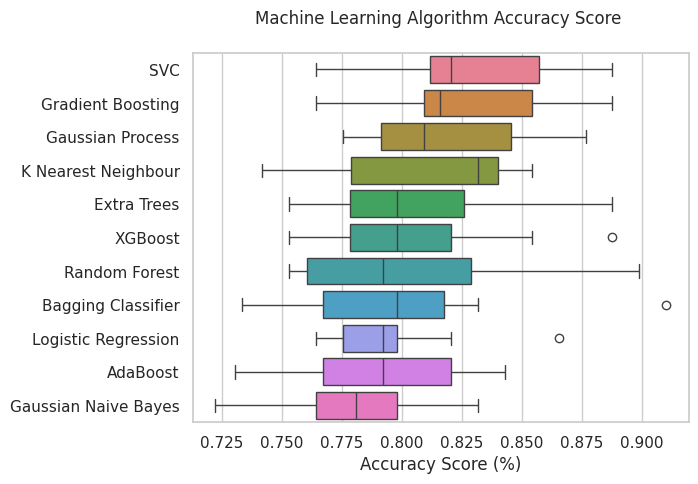

In [121]:
result_df = result_df.drop(['mean'], axis=1)
sns.boxplot(data=result_df.T, orient='h')
plt.title('Machine Learning Algorithm Accuracy Score \n')
plt.xlabel('Accuracy Score (%)');

In [122]:
# 중요도를 보는 함수를 만듭니다.
def importance_plotting(data, xlabel, ylabel, title, n=20):
    sns.set(style="whitegrid")
    ax = data.tail(n).plot(kind='barh')

    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)
    plt.show()

In [123]:
# 데이터 프레임에 항목 중요도를 넣습니다.
fi = {'Features':train.columns.tolist(), 'Importance':xgb.feature_importances_}
importance = pd.DataFrame(fi, index=fi['Features']).sort_values('Importance', ascending=True)

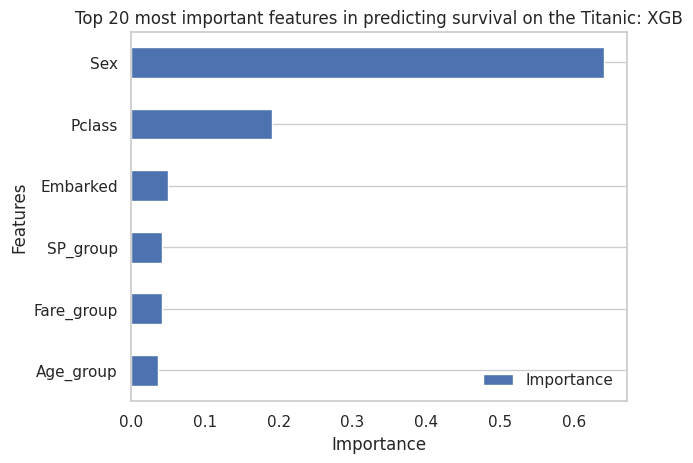

In [124]:
# 그래프 제목
title = 'Top 20 most important features in predicting survival on the Titanic: XGB'

# 그래프 그리기
importance_plotting(importance, 'Importance', 'Features', title, 20)

## 하이퍼 파라미터 튜닝

In [125]:
# 파라미터 서치
Cs = [0.01, 0.1, 1, 5, 10, 15, 20, 50]
gammas = [0.001, 0.01, 0.1]

# 파라미터 그리드 셋팅
hyperparams = {'C': Cs, 'gamma' : gammas}

# 교차검증
gd=GridSearchCV(estimator = SVC(probability=True), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

# 모델 fiting 및 결과
gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
0.8260435628648548
{'C': 50, 'gamma': 0.01}


In [126]:
learning_rate = [0.01, 0.05, 0.1, 0.2, 0.5]
n_estimators = [100, 1000, 2000]
max_depth = [3, 5, 10, 15]

hyperparams = {'learning_rate': learning_rate, 'n_estimators': n_estimators}

gd=GridSearchCV(estimator = GradientBoostingClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
0.8227041616973197
{'learning_rate': 0.05, 'n_estimators': 100}


In [127]:
penalty = ['l1', 'l2']
C = np.logspace(0, 4, 10)

hyperparams = {'penalty': penalty, 'C': C}

gd=GridSearchCV(estimator = LogisticRegression(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
0.793496955621116
{'C': 7.742636826811269, 'penalty': 'l2'}


In [139]:
learning_rate = [0.001, 0.005, 0.01, 0.05, 0.1, 0.2]
n_estimators = [10, 50, 100, 250, 500, 1000]

hyperparams = {'learning_rate': learning_rate, 'n_estimators': n_estimators}

gd=GridSearchCV(estimator = XGBClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
0.8092272926997678
{'learning_rate': 0.2, 'n_estimators': 100}


In [140]:
max_depth = [3, 4, 5, 6, 7, 8, 9, 10]
min_child_weight = [1, 2, 3, 4, 5, 6]

hyperparams = {'max_depth': max_depth, 'min_child_weight': min_child_weight}

gd=GridSearchCV(estimator = XGBClassifier(learning_rate=0.2, n_estimators=100), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
0.82045069361622
{'max_depth': 7, 'min_child_weight': 5}


In [143]:
gamma = [i*0.1 for i in range(0,5)]

hyperparams = {'gamma': gamma}

gd=GridSearchCV(estimator = XGBClassifier(learning_rate=0.2, n_estimators=100, max_depth=7,
                                          min_child_weight=5), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
0.82045069361622
{'gamma': 0.0}


In [144]:
subsample = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
colsample_bytree = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]

hyperparams = {'subsample': subsample, 'colsample_bytree': colsample_bytree}

gd=GridSearchCV(estimator = XGBClassifier(learning_rate=0.2, n_estimators=100, max_depth=7,
                                          min_child_weight=5, gamma=0), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
0.8238152030632101
{'colsample_bytree': 0.7, 'subsample': 0.85}


In [145]:
reg_alpha = [1e-5, 1e-2, 0.1, 1, 100]

hyperparams = {'reg_alpha': reg_alpha}

gd=GridSearchCV(estimator = XGBClassifier(learning_rate=0.2, n_estimators=100, max_depth=7,
                                          min_child_weight=5, gamma=0, subsample=0.85, colsample_bytree=0.7),
                                         param_grid = hyperparams, verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
0.8271797125102001
{'reg_alpha': 0.01}


In [133]:
n_restarts_optimizer = [0, 1, 2, 3]
max_iter_predict = [1, 2, 5, 10, 20, 35, 50, 100]
warm_start = [True, False]

hyperparams = {'n_restarts_optimizer': n_restarts_optimizer, 'max_iter_predict': max_iter_predict, 'warm_start': warm_start}

gd=GridSearchCV(estimator = GaussianProcessClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 64 candidates, totalling 320 fits
0.82045069361622
{'max_iter_predict': 1, 'n_restarts_optimizer': 0, 'warm_start': True}


In [134]:
n_estimators = [10, 100, 200, 500]
learning_rate = [0.001, 0.01, 0.1, 0.5, 1, 1.5, 2]

hyperparams = {'n_estimators': n_estimators, 'learning_rate': learning_rate}

gd=GridSearchCV(estimator = AdaBoostClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
0.7923608059757705
{'learning_rate': 0.1, 'n_estimators': 500}


In [135]:
n_neighbors = [1, 2, 3, 4, 5]
algorithm = ['auto']
weights = ['uniform', 'distance']
leaf_size = [1, 2, 3, 4, 5, 10]

hyperparams = {'algorithm': algorithm, 'weights': weights, 'leaf_size': leaf_size,
               'n_neighbors': n_neighbors}

gd=GridSearchCV(estimator = KNeighborsClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

# Fitting model and return results
gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
0.8014311719289434
{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 5, 'weights': 'uniform'}


In [136]:
n_estimators = [10, 50, 100, 200]
max_depth = [3, None]
max_features = [0.1, 0.2, 0.5, 0.8]
min_samples_split = [2, 6]
min_samples_leaf = [2, 6]

hyperparams = {'n_estimators': n_estimators, 'max_depth': max_depth, 'max_features': max_features,
               'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf}

gd=GridSearchCV(estimator = RandomForestClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 128 candidates, totalling 640 fits
0.8215805661917017
{'max_depth': None, 'max_features': 0.1, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}


In [137]:
n_estimators = [10, 25, 50, 75, 100]
max_depth = [3, None]
max_features = [0.1, 0.2, 0.5, 0.8]
min_samples_split = [2, 10]
min_samples_leaf = [2, 10]

hyperparams = {'n_estimators': n_estimators, 'max_depth': max_depth, 'max_features': max_features,
               'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf}

gd=GridSearchCV(estimator = ExtraTreesClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 160 candidates, totalling 800 fits
0.8226978846274559
{'max_depth': None, 'max_features': 0.8, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}


In [138]:
n_estimators = [10, 50, 75, 100, 200]
max_samples = [0.1, 0.2, 0.5, 0.8, 1.0]
max_features = [0.1, 0.2, 0.5, 0.8, 1.0]

hyperparams = {'n_estimators': n_estimators, 'max_samples': max_samples, 'max_features': max_features}

gd=GridSearchCV(estimator = BaggingClassifier(), param_grid = hyperparams,
                verbose=True, cv=5, scoring = "accuracy", n_jobs=-1)

gd.fit(X_train, y_train)
print(gd.best_score_)
print(gd.best_params_)

Fitting 5 folds for each of 125 candidates, totalling 625 fits
0.8283033080158182
{'max_features': 0.8, 'max_samples': 0.2, 'n_estimators': 100}


## 모델 재 트레이닝

In [148]:
# 튜닝 모델 시작
# sample을 split하는 것은 전체데이터 80%를 트레인셋에 20%는 테스트셋에 줌
ran = RandomForestClassifier(max_depth=None, max_features=0.1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=1)

knn = KNeighborsClassifier(leaf_size=1, n_neighbors=5, weights='uniform')

log = LogisticRegression(C=7.742636826811269, penalty='l2')

xgb = XGBClassifier(learning_rate=0.2, n_estimators=100, max_depth=7,
                                          min_child_weight=5, gamma=0, subsample=0.85, colsample_bytree=0.7, reg_alpha=0.01)

gbc = GradientBoostingClassifier(learning_rate=0.05, max_depth=3, n_estimators=100)

svc = SVC(probability=True, gamma=50, C=0.01)

ext = ExtraTreesClassifier(max_depth=None, max_features=0.8, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=1)

ada = AdaBoostClassifier(learning_rate=0.1, n_estimators=500, random_state=1)

gpc = GaussianProcessClassifier(max_iter_predict=1, n_restarts_optimizer=0, warm_start=True)

bag = BaggingClassifier(max_features=0.8, max_samples=0.2, n_estimators=100, random_state=1)

# 리스트
models = [ran, knn, log, xgb, gbc, svc, ext, ada, gnb, gpc, bag]
model_names = ['Random Forest', 'K Nearest Neighbour', 'Logistic Regression', 'XGBoost', 'Gradient Boosting', 'SVC', 'Extra Trees', 'AdaBoost', 'Gaussian Naive Bayes', 'Gaussian Process', 'Bagging Classifier']
scores3 = {}

# Sequentially fit and cross validate all models
for ind, mod in enumerate(models):
    mod.fit(X_train, y_train)
    acc = cross_val_score(mod, X_train, y_train, scoring = "accuracy", cv = 10)
    scores3[model_names[ind]] = acc

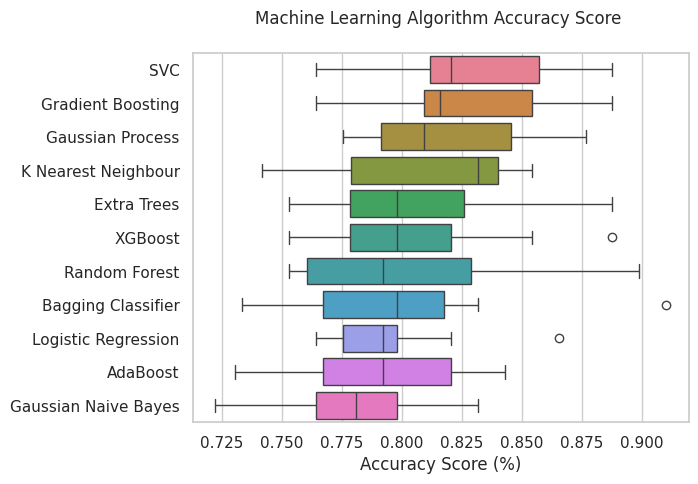

In [149]:
results = pd.DataFrame(scores).T
results['mean'] = results.mean(1)
result_df = results.sort_values(by='mean', ascending=False)
result_df.head(11)


result_df = result_df.drop(['mean'], axis=1)
sns.boxplot(data=result_df.T, orient='h')
plt.title('Machine Learning Algorithm Accuracy Score \n')
plt.xlabel('Accuracy Score (%)');

## 마지막 보팅

In [150]:
#튜닝한 파라미터로 하드보팅
grid_hard = VotingClassifier(estimators = [('Random Forest', ran),
                                           ('Logistic Regression', log),
                                           ('XGBoost', xgb),
                                           ('Gradient Boosting', gbc),
                                           ('Extra Trees', ext),
                                           ('AdaBoost', ada),
                                           ('Gaussian Process', gpc),
                                           ('SVC', svc),
                                           ('K Nearest Neighbour', knn),
                                           ('Bagging Classifier', bag)], voting = 'hard')

grid_hard_cv = model_selection.cross_validate(grid_hard, X_train, y_train, cv=10)
grid_hard.fit(X_train, y_train)

print("Hard voting on test set score mean: {:.2f}". format(grid_hard_cv['test_score'].mean() * 100))

Hard voting on test set score mean: 81.71


In [151]:
grid_soft = VotingClassifier(estimators = [('Random Forest', ran),
                                           ('Logistic Regression', log),
                                           ('XGBoost', xgb),
                                           ('Gradient Boosting', gbc),
                                           ('Extra Trees', ext),
                                           ('AdaBoost', ada),
                                           ('Gaussian Process', gpc),
                                           ('SVC', svc),
                                           ('K Nearest Neighbour', knn),
                                           ('Bagging Classifier', bag)], voting = 'soft')

grid_soft_cv = model_selection.cross_validate(grid_soft, X_train, y_train, cv=10)
grid_soft.fit(X_train, y_train)

print("Soft voting on test set score mean: {:.2f}". format(grid_soft_cv['test_score'].mean() * 100))

Soft voting on test set score mean: 82.05


## 마지막 모델 예측

In [152]:
# Final predictions2
predictions = grid_hard.predict(X_test)

submission = pd.concat([pd.DataFrame(passId), pd.DataFrame(predictions)], axis = 'columns')

submission.columns = ["PassengerId", "Survived"]
submission.to_csv('titanic_submission1.csv', header = True, index = False)

In [153]:
# Final predictions
predictions = grid_soft.predict(X_test)

submission = pd.concat([pd.DataFrame(passId), pd.DataFrame(predictions)], axis = 'columns')

submission.columns = ["PassengerId", "Survived"]
submission.to_csv('titanic_submission2.csv', header = True, index = False)